# Mathematical models of circadian rhythms using light intensity data

`circStudio` implements a suite of mathematical models developed to characterize and predict human circadian physiology, including: `Forger`, `Jewett`, `HannaySP`, `HannayTP`, `Hilaire07`, `Breslow13` and `Skeldon23`. 

These models enable the estimation of key circadian phase markers, such as the core body temperature minimum ($CBT_min$) and dim light melatonin onset ($DLMO$). In the case of the `Skeldon23`, you can also simulate or predict sleep-wake dynamics.

We begin by importing the required libraries:

In [5]:
import circstudio as cs
import matplotlib.pyplot as plt
import os
import plotly.io as pio
pio.templates.default = "plotly_white"
pio.renderers.default = "notebook"

Import a sample RPX file:

In [6]:
# Create file path for sample files within the circStudio package
fpath = os.path.join(os.path.dirname(cs.__file__))

# Create a new Raw instance using awd RPX adaptor
raw = cs.io.read_rpx(os.path.join(fpath, 'data', 'test_sample_rpx_eng.csv'),
                             start_time='2015-07-04 12:00:00',
                             light_mode='White Light',
                             period='6 days',
                             language='ENG_UK')

Before running the models, visualize the light schedule:

In [7]:
raw.plot(mode='light', log='True')

### 1. Create a model instance

After loading the sample data, the next step is to instantiate a circadian model:

In [8]:
# Create a new instance of the Forger model using light data
forger = cs.Forger(data=raw.light)

All models require a time-resolved light input (e.g., lux values sampled at regular intervals), provided here via `raw.light`. The initialization syntax is consistent across models:

In [9]:
# Jewett model
jewett = cs.Jewett(data=raw.light)

In [10]:
# HannaySP model
hannaysp = cs.HannaySP(data=raw.light)

In [11]:
# HannayTP model
hannaytp = cs.HannayTP(data=raw.light)

In [12]:
# Breslow13 model (melatonin model)
breslow13 = cs.Breslow13(data=raw.light)

`Hilaire07` requires both a light schedule and a sleep schedule as inputs. 
By default, the sleep schedule is inferred using the Roenneberg algorithm; however, a user-defined schedule may be provided via the `sleep_algo` argument. Any externally supplied sleep schedule must be indexed by datetime. This argument can also be used to choose a different algorithm (e.g., Crespo).

In [13]:
# Hilaire07 model
hilaire07 = cs.Hilaire07(data=raw.light, sleep_algo='Roenneberg')

The resulting model states are stored in the `model_states` attribute.

### 2. Obtain initial conditions

By default, when a model is instantiated, the trajectory is computed using a predefined set of initial conditions, assuming a light schedule of 16 hours of light followed by 8 hours of complete darkness. To obtain **more realistic and representative initial conditions** for the model states, the model can be run iteratively over the light vector util it reaches a stable solution, assessed by convergence of the DLMO. For this, users must specify the number of iterations (`loop_number`) and provide the light data to be used in the loop:

In [14]:
# Loop over the provided light trajectory to determine new initial state
forger.get_initial_conditions(data=raw.light, loop_number=50)

array([0.81875691, 0.63943572, 0.32176247])

### 3. Visualize results and extract biological quantities
From the model output, it is possible to **extract a series of predicted $DLMOs**. By default, these values are expressed in hours relative to the start of the recording. To convert them to a 24-hour clock format, the modulo operator (`% 24`) can be applied:

In [15]:
# Obtain array of daily DLMOs
forger.dlmos() % 24

array([7.775     , 7.84166667, 7.825     , 7.66666667, 7.55833333,
       7.79166667])

Using the `plot()` method in the `Model` class, it is possible to visually inspect the evolution of the daily predicted DLMO:

In [16]:
forger.plot(dlmo=True)

Using the same function, it is possible to visualize the evolution of all model states for the Forger model:

In [17]:
forger.plot(states=True)

This dynamic visualization is particularly useful when there are several model states, such as in the `breslow13` model, which predicts the trajectory of melatonin:

In [18]:
breslow13.plot(states=True)

### 4. Inferring sleep patterns from light trajectories using the `Skeldon23` model
[Skeldon and colleagues (2023)](https://journals.plos.org/ploscompbiol/article?id=10.1371/journal.pcbi.1011743) developed a Homeostatic-Circadian-Light (HCL) model that combines circadian dynamics with a homeostatic sleep drive to predict sleep timing from light exposure. Specifically, the model incorporates a homeostatic process, $H(t)$, which accumulates during wakefulness and decays exponentially during sleep. 

The dynamics of $H(t)$, in combination with the circadian oscillator, enable the simulation and prediction of sleep-wake patterns under a given light schedule.

In [19]:
# Create new instance of Skeldon23 model
skeldon23 = cs.Skeldon23(data=raw.light)

# Obtain new initial conditions based on the given light schedule
initial_conditions = skeldon23.get_initial_conditions(data=raw.light, loop_number=20)

# Run the model
skeldon23.run(initial_state=initial_conditions)

# Plot the results
skeldon23.plot(states=True)

### 5. Entrainment Signal Regularity Index (ESRI)

It is possible to use HannaySP model to compute the so-called **Entrainment Signal Regularity Index (ESRI)**. This metric quantifies how effectively a given light input can entrain the circadian system, ranging from 0 (no entrainment) to 1 (a maximally entraining signal).

In [10]:
# Compute ESRI
esri = cs.ESRI(data=raw.light)

In [15]:
# ESRI mean
esri.mean

np.float64(0.5954385886920878)

In [16]:
# ESRI std
esri.std

np.float64(0.05484547296502348)

### 6. Model Comparison Utility
ModelComparer implements a translating layer between the Cartesian state-space representation of Kronauer (e.g., Forger, Jewett, Hilaire07) models and the phase-based representation of the HannaySP model. Specifically, it reconstructs the Forger model state variables ($x$ and $x_c$) from the collective phase predicted by HannaySP using a parametric trigonometric mapping. Geometrically, this mapping corresponds to embedding the phase oscillator on an ellipse in the ($x$, $x_c$) plane.

#### Translation layer (HannaySP phase → Forger state variables)

Let $\phi(t)$ denote the HannaySP collective phase. ModelComparer approximates the Forger state variables as:

$$
\hat{x}(t) = a_1 \cos\!\big(p_1 \,\phi(t)\big) + m_1
$$

$$
\hat{x}_c(t) = -\,a_2 \sin\!\big(p_2 \,\phi(t)\big) + m_2
$$

where:
* $a_1$ and $a_2$ are amplitude (scaling) parameters.
* $p_1$ and $p_2$ are phase-scaling parameters.
* $m_1$ and $m_2$ are offsets (centering terms).

#### Parameter estimation

To adapt the translating layer to a given light schedule, ModelComparer can estimate ($a_1$, $m_1$, $p_1$) and ($a_2$, $m_2$, $p_2$) via non-linear least squares, fitting $x(t)$ and $x_c(t)$ from the Forger model using the equations above.

#### Interpretation and expected behavior

Empirically, a substantial proportion of the variability in the Forger state variables can be captured by $sin(φ(t))$ and $cos(φ(t))$, making this mapping a practical bridge between the physiologically interpretable Hannay model and Kronauer-based models.

The mapping is typically most accurate under stable, regular light–dark schedules (i.e., consistent lights-on and lights-off timing), and deviations tend to increase as schedules become more irregular, multi-phasic, or rapidly shifting (conditions under which amplitude dynamics and transient effects become more prominent).

#### Usage example

In [84]:
# Create instance of ModelComparer
comparer = cs.ModelComparer(data=raw.light, equilibrate=True)

# Fit a line to the phase prediction by HannaySP
comparer.linearize_phase(change_params=True)

# Find the optimal translation parameters
comparer.find_optimal_params(change_params=True)

# Predict Forger trace
comparer.predict_forger(change_params=True)

# Compute the cumulative rmse
crmse_x, crmse_xc = comparer.cumulative_rmse()

To quantify how well the phase-based reconstruction captures the Forger state variables, we compute the cumulative root-mean-square error (RMSE) between the observed states ($x$, $x_c$) and their phase-derived predictions $\hat{x}(t)$ and $\hat{x}_c(t)$.

RMSE quantifies how different are predicted and observed oscillator states, with a large RMSE indicating a larger disagreement between the predicted and observed values. By using cumulative RMSE, we assess how this discrepancy evolves over time, revealing how quickly the two models converge under a given light schedule.

When plotted over time, the cumulative RMSE curves typically exhibits an approximately exponential decay, reflecting the gradual entrainment and stabilization of the oscillator. The rate o decay therefore provides a quantitative measure of how efficiently the translating layer captures the evolving oscillator dynamics.

To characterize this convergence behavior, `circStudio` fits an exponential decay function to the cumulative RMSE curves and estimates the corresponding half-time, representing the time required for the prediction error to decrease by 50% (it quantifies how rapidly the phase-based reconstruction stabilizes):

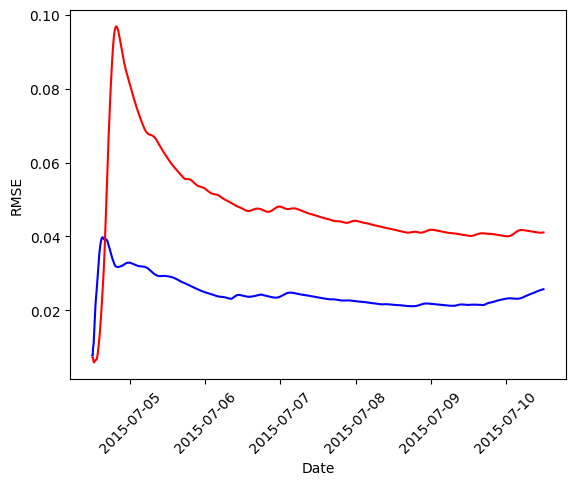

In [85]:
# Define color map to plot crmse_x and crmse_xc
errors = {'blue': crmse_x, 'red': crmse_xc}

# Plot the two curves
for error in errors.keys():
    plt.plot(raw.light.index, errors[error], color=error)

# Rotate xticks
plt.xticks(rotation=45)

# Label x and y axis
plt.xlabel('Date')
plt.ylabel('RMSE')

# Show the figure
plt.show()

In [86]:
comparer.half_life_crmse()

(inf, np.float64(65.92726778033916))

For the schedule shown here, the cumulative RMSE for $x_c$ ($rmse\_xc$) stabilizes around index ~66 of the recording (2015-07-04):

In [61]:
raw.activity.index[5]

Timestamp('2015-07-04 12:02:30')

Notice the estimated half-time for $rmse\_x$ is infinite. This occurs when the exponential fit does not yield a positive decay constant, indicating that the cumulative error does not show a clear exponential convergence within the observed time window.

In practical terms, an infinite half-time may suggest that the translating layer does not fully stabilize under the given schedule, either because the light pattern is insufficiently regular to promote strong entrainment or because the recording duration is too short to capture the decay of transient dynamics. In such cases, the prediction error does not decrease in a manner consistent with exponential relaxation, and no finite half-time can be defined.

## Next steps

The ModelComparer framework is currently under active development. Ongoing work aims to enhance the robustness of the translation layer, extend support to additional circadian model formulations, and further validate the convergence metrics under diverse light schedules.